# 第十五次课后练习



<span style="color:red; font-weight:bold;">请将作业文件命名为 第十五次课后练习+姓名+学号.ipynb, 例如 第十五次课后练习+张三+1000000000.ipynb</span>

<span style="color:red; font-weight:bold;">在作业过程中觉得有心得或者自己拓展学习到有价值内容的，可以在文件名最后加一个#号。例如第十五次课后练习+张三+1000000000+#.ipynb</span>

In [3]:
!pip install opencv-python matplotlib numpy seaborn

: 

## 第零部分：请认真阅读代码，理解python opencv包的相关基本操作

### 0.0 读取图片（格式为numpy.ndarray）、图片数据的意义（长 \* 宽 \* RGB强度值）、显示图片、逐像素点操作

图片lena.jpg的数据类型为： <class 'numpy.ndarray'>
图片lena.jpg的形状为： (512, 512, 3)
图片lena.jpg的第一个像素点的值为： [0.88627451 0.5372549  0.49019608]

显示原始图片的第一个像素点


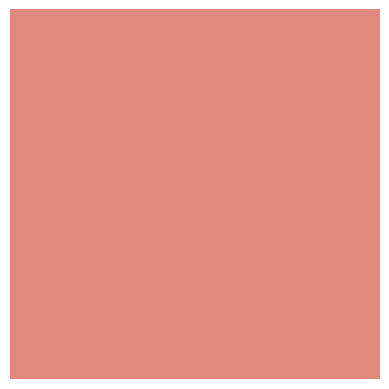

显示整张原始图片


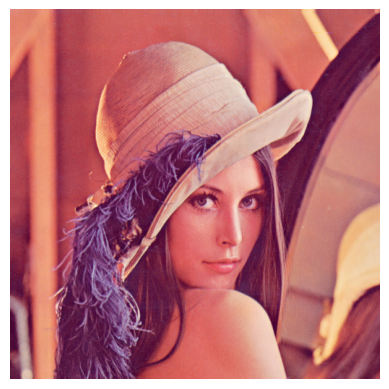

操作图片的内容（把一部分头发复制粘贴到另一个区域）


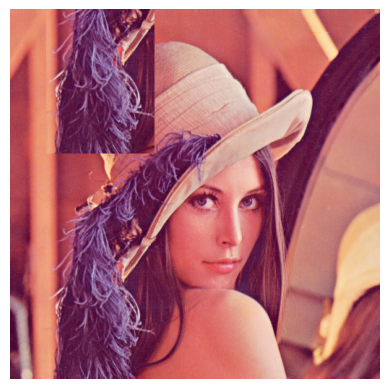

In [1]:
import matplotlib.pyplot as plt # plt 用于显示图片
import cv2
import numpy as np

# 读取图片
lena = cv2.imread('lena.jpg') # 读取和代码处于同一目录下的 lena.jpg
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB) / 255.0 # 将BGR转换为RGB，并且将颜色数值从0-255转换为0-1

# 查看图片的类型和形状
print('图片lena.jpg的数据类型为：', type(lena))
print('图片lena.jpg的形状为：', lena.shape)
print('图片lena.jpg的第一个像素点的值为：', lena[0, 0, :])

# 显示第一个像素点
print("\n显示原始图片的第一个像素点")
plt.imshow(lena[0:1, 0:1, :])
plt.axis("off")
plt.show()

# 显示整张图片
print("显示整张原始图片")
plt.imshow(lena)
plt.axis("off")
plt.show()

# 操作图片的内容
print("操作图片的内容（把一部分头发复制粘贴到另一个区域）")
hair = lena[300:500, 50:200, :]
copy_lena = lena.copy()
copy_lena[0:200, 50:200, :] = hair
plt.imshow(copy_lena)
plt.axis("off")
plt.show()

### 0.1 对图片的简单像素操作

(512, 512)


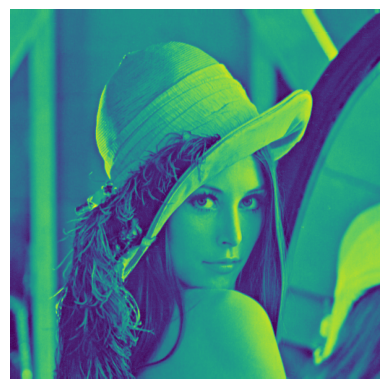

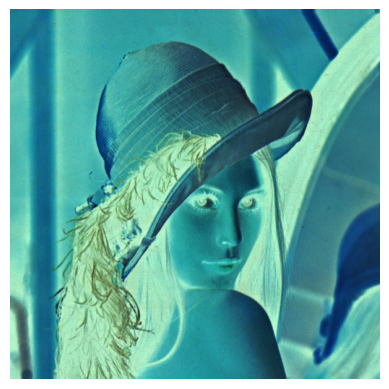

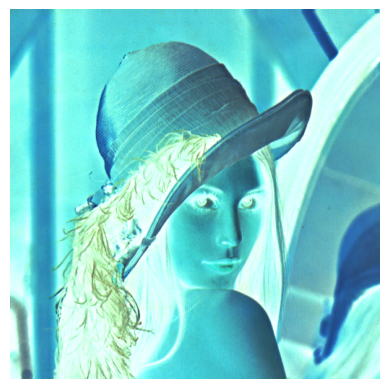

In [2]:
# 加载灰度图像
gray_lena = cv2.imread('lena.jpg', 0)  # 0表示加载灰度图像
print(gray_lena.shape)
plt.imshow(gray_lena)
plt.axis("off")
plt.show()

# 对图像取反
reverse_lena = 1 - lena
plt.imshow(reverse_lena)
plt.axis("off")
plt.show()

# 对图像像素做线性变换
new_lena = np.zeros_like(reverse_lena)
for i in range(reverse_lena.shape[0]):
    for j in range(reverse_lena.shape[1]):
        new_lena[i, j] = reverse_lena[i, j] * 1.2 + 0.1
new_lena = np.where(new_lena > 1.0, 1.0, new_lena)
plt.imshow(new_lena)
plt.axis("off")
plt.show()

### 0.2 对图像设定颜色阈值

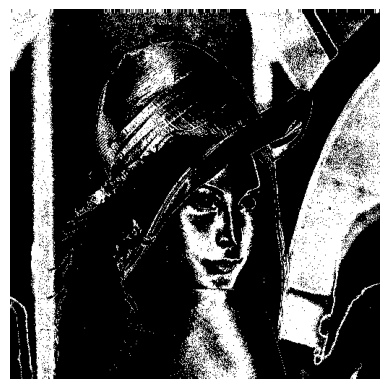

In [3]:
# 通过cv2.inRange()函数对图像设定颜色阈值
lena = cv2.imread('lena.jpg') # 读取和代码处于同一目录下的 lena.jpg
lower_blue = np.array([100, 100, 100])
upper_blue = np.array([130, 255, 255])
threshold_lena = cv2.inRange(lena, lower_blue, upper_blue)
plt.imshow(threshold_lena,'gray')
plt.axis("off")
plt.show()

### 0.3  使用Canny算法进行图像边缘检测

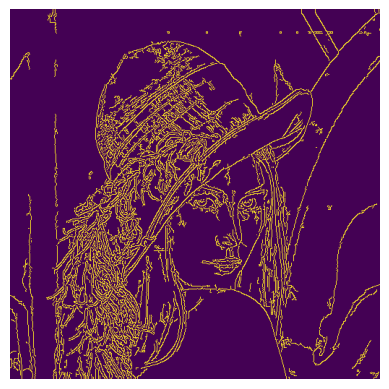

In [4]:
import matplotlib.pyplot as plt # plt 用于显示图片
import cv2
import numpy as np
lena = cv2.imread('lena.jpg') # 读取和代码处于同一目录下的 lena.jpg
canny_image = cv2.Canny(lena, 50, 150)
plt.imshow(canny_image)
plt.axis("off")
plt.show()

### 0.4 numpy实现高斯模糊

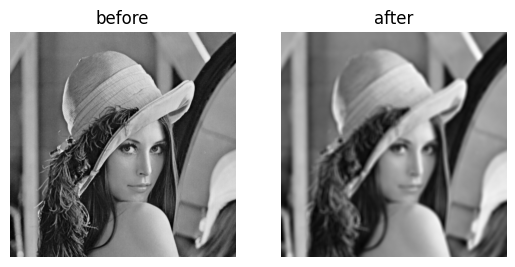

In [5]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def func_1(img, kernel):
    h, w = img.shape
    hk, wk = kernel.shape
    i0,j0 = np.meshgrid(range(hk),range(wk),indexing='ij')
    i1,j1 = np.meshgrid(range(h-hk+1),range(w-wk+1),indexing='ij')
    i = i0.reshape(-1,1)+i1.reshape(1,-1)
    j = j0.reshape(-1,1)+j1.reshape(1,-1)
    select_img = img[i,j] # (hk*wk, h*w)
    weights = kernel.reshape(1,-1) # (1,hk*wk)
    output = weights @ select_img
    output = output.reshape(h-hk+1,w-wk+1)
    return output

def gkern(l=5, sig=1.):
    """
    creates gaussian kernel with side length `l` and a sigma of `sig`
    """
    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    kern_1d = np.exp(-0.5 * (ax**2) / (sig**2))
    kernel = np.outer(kern_1d, kern_1d)
    return kernel / np.sum(kernel)

img = cv2.imread('lena.jpg', 0) / 255.0
kern = gkern(9,5)
img_processed = func_1(img, kern)

plt.subplot(121)
plt.title('before')
plt.axis("off")
plt.imshow(img,cmap='gray')
plt.subplot(122)
plt.title('after')
plt.axis("off")
plt.imshow(img_processed,cmap='gray')
plt.show()

### 0.5 膨胀操作 （可以自行补充腐蚀操作）
图像膨胀的一般步骤:

1. 创建一个像素块(像素块可为任意形状，一般为矩形。自带一个核心，也叫做锚点,一般位于矩阵中央)
2. 将像素块中的核心像素依次置于图像每个像素点(遍历图像所有像素)。
3. 将像素块下所覆盖的所有像素的最大值赋给核心像素。

可以通过cv2.dilate()函数实现图像的膨胀操作。下面例子展示了使用一个5\*5的卷积核对图片进行膨胀操作的例子。

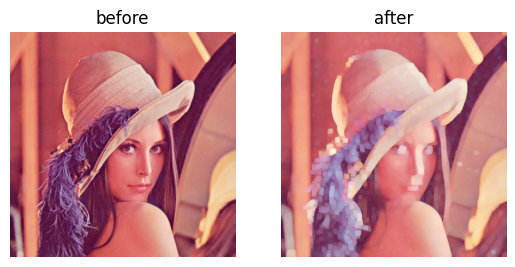

In [6]:
lena = cv2.imread('lena.jpg') # 读取和代码处于同一目录下的 lena.jpg
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB) / 255.0 # 将BGR转换为RGB，并且将颜色数值从0-255转换为0-1
plt.subplot(121)
plt.title('before')
plt.imshow(lena)
plt.axis("off")

kernel = np.ones((9, 9), dtype=np.uint8)
dilate_lena = cv2.dilate(lena, kernel, 50) # 1:迭代次数，也就是执行几次膨胀操作
plt.subplot(122)
plt.title('after')
plt.imshow(dilate_lena)
plt.axis("off")
plt.show()

## **0.6** 仿射变换（Affine Transformation）

仿射变换是一种线性变换 + 平移，保持了图像的平直性和平行性：

平直性：直线变换后还是直线

平行性：平行线变换后仍然平行

自由度	6个	

变换矩阵	2×3	

最少需要点数	3个点	

仿射变换包含的操作

平移（Translation）

旋转（Rotation）

缩放（Scaling）

斜切（Shearing / Skewing）

数学公式：

dst(x,y) = a*x + b*y + c

          d*x + e*y + f

### 图像平移

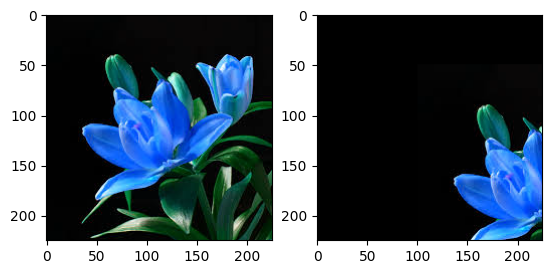

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('0-3-input.png')
H = np.float32([[1,0,100],[0,1,50]])
rows,cols = img.shape[:2]
res = cv2.warpAffine(img,H,(rows,cols)) #需要图像、变换矩阵、变换后的大小
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(res)

### 图像的扩大与缩小

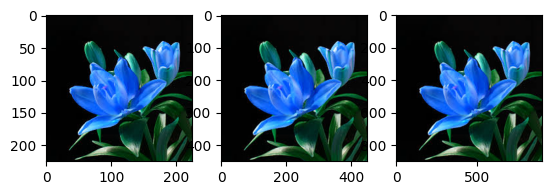

In [8]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('0-3-input.png')

res1 = cv2.resize(img,None,fx=2,fy=2,interpolation=cv2.INTER_CUBIC)
#直接规定缩放大小，这个时候就不需要缩放因子
height,width = img.shape[:2]
res2 = cv2.resize(img,(4*width,4*height),interpolation=cv2.INTER_CUBIC)
plt.subplot(131)
plt.imshow(img)
plt.subplot(132)
plt.imshow(res1)
plt.subplot(133)
plt.imshow(res2)


### 图像的旋转

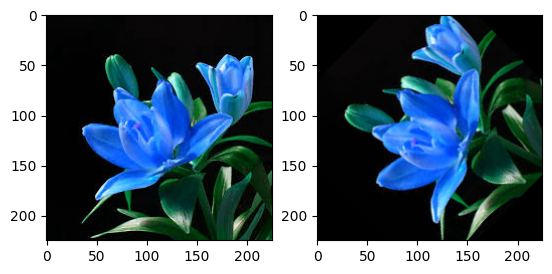

In [9]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('0-3-input.png')
rows,cols = img.shape[:2]
#第一个参数旋转中心，第二个参数旋转角度，第三个参数：缩放比例
M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
#第三个参数：变换后的图像大小
res = cv2.warpAffine(img,M,(rows,cols))

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(res)

### 图像的仿射

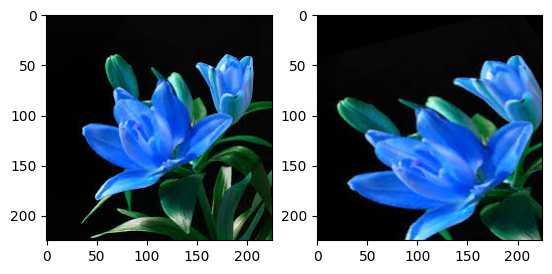

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('0-3-input.png')
rows,cols = img.shape[:2]
pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
#第三个参数：变换后的图像大小
res = cv2.warpAffine(img,M,(rows,cols)) # res = cv2.warpAffine(img, M, (cols, rows)) 
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(res)

## 1. 基于opencv的基本操作（阅读理解代码，观察运行结果， 同时注意学习模型思想）

在opencv中有许多常用的图像处理的函数cv2.Sobel(), cv2.Laplacian(), cv2.GaussianBlur()等，可以参见[官方文档](https://docs.opencv.org/4.x/d2/d96/tutorial_py_table_of_contents_imgproc.html)进一步学习。

在这一章中，希望您可以学习到opencv的一些基本操作以及背后的原理。

### 1.1 模糊、锐化
1. 请用以下两种方式实现对图像的高斯模糊操作，默认模糊核尺寸$k_X=k_Y=15$, 标准差$\sigma_X=\sigma_Y=5$.

    - 直接使用cv2.GaussianBlur()；

    - 用cv2.getGaussianKernel()和cv2.filter2D()组合完成（注意cv2.filter2D的参数）

2. 请用sharpened = original + (original − blurred) * amount进行锐化操作，其中blurred为按默认参数做高斯模糊的结果，amount默认为0.6。注：这一操作被称为USM([Unsharp Masking](https://en.wikipedia.org/wiki/Unsharp_masking))。

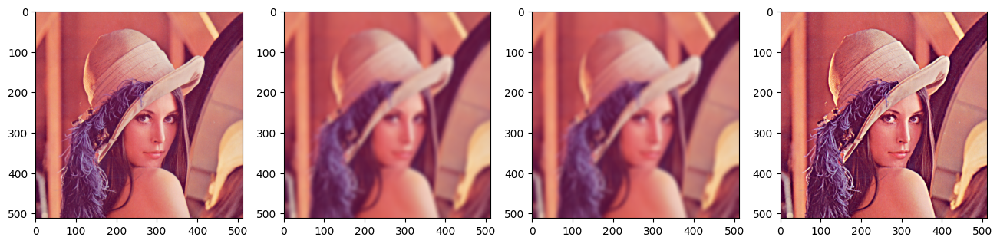

In [11]:
def blur_cv2(image,ksize=15,sigma=5):
    return cv2.GaussianBlur(image,(ksize,ksize),sigma)

def blur_custom(image,ksize=15,sigma=5):
    kern1d = cv2.getGaussianKernel(ksize,sigma=sigma)
    kern = kern1d * kern1d.T
    result = cv2.filter2D(image, -1, kernel=kern)
    return result

def USM(image, amount=.6):
    return np.clip(image + (image - blur_custom(image))*amount, 0, 1)

plt.figure(figsize=(16,4))
plt.subplot(141)
plt.imshow(USM(lena,0))
plt.subplot(142)
plt.imshow(blur_cv2(lena,15,5))
plt.subplot(143)
plt.imshow(blur_custom(lena,15,5))
assert np.allclose(blur_cv2(lena,15,5),blur_custom(lena,15,5))
plt.subplot(144)
plt.imshow(USM(lena,0.6))
plt.show()

### 1.2 梯度相关的算子（2.5分）
Sobel算子常用于获得图像的一阶梯度，形式上图像$I$关于$x$和$y$的一阶梯度分别可以用下式中的$G_x$和$G_y$来近似（这里以$k=3$的Sobel算子为例），对应cv2.Sobel()：
$$
G_x = \left[\begin{matrix}-1 & 0 & 1\\-2 & 0 & 2 \\ -1 & 0 & 1\end{matrix}\right] \ast I,\quad
G_y = \left[\begin{matrix}1 & 2 & 1\\0 & 0 & 0 \\ -1 & -2 & -1\end{matrix}\right] \ast I,
$$
其中$\ast$表示卷积运算（为简化描述，之后我们仅描述卷积核，忽略卷积图像的部分）。

细心的同学可能会发现，应用Sobel算子的结果理应是近似一阶梯度的若干倍，但由于我们一般仅关注梯度绝对值的*相对大小*，这里可以忽略这个倍数的关系。

Laplacian算子被定义为$\Delta I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}$，我们一般可以用以下两种核去卷积图像得到近似的结果，对应cv2.Laplacian()：
$$
\left[\begin{matrix}0 & -1 & 0\\-1 & 4 & -1 \\ 0 & -1 & 0\end{matrix}\right], \quad \left[\begin{matrix}-1 & -1 & -1\\-1 & 8 & -1 \\ -1 & -1 & -1\end{matrix}\right]
$$

Hessian算子通过求$\det\left(\left[\begin{matrix} I_{xx} & I_{xy}\\I_{xy} & I_{yy} \end{matrix}\right] \right)$来检测极值点，课件上已有详细介绍，这里不再展开。

请用**除了opencv中直接实现的函数以外的方法**，例如用cv2.filter2D()、numpy中的函数等实现以下功能（?分）
- $k=3$的Sobel算子
- Laplacian算子（其中Laplacian算子选用第一种卷积核）
- 求Hessian矩阵的行列式值（基于$k=3$的Sobel算子）
- 根据$\frac{\partial I}{\partial x}$和$\frac{\partial I}{\partial y}$（基于$k=3$的Sobel算子）求梯度方向和梯度强度（求L2 norm，不用课件里的近似）

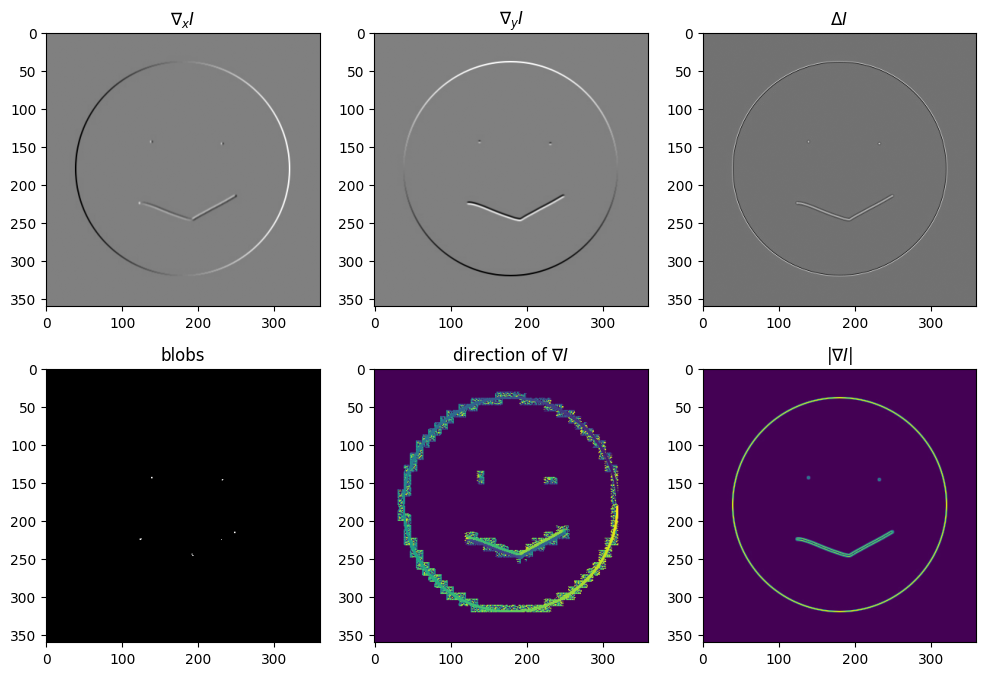

In [12]:
def sobel_x(image):
    return cv2.filter2D(image,-1,np.array([[-1,0,1],[-2,0,2],[-1,0,1]]))

def sobel_y(image):
    return cv2.filter2D(image,-1,np.array([[1,2,1],[0,0,0],[-1,-2,-1]]))

def laplacian(image):
    return cv2.filter2D(image,-1,np.array([[0,-1,0],[-1,4,-1],[0,-1,0]]))

def phase_magnitude(grad_x, grad_y):
    # returns (phase, magnitude), where `phase` is in degree (0°~360°).
    # rad = np.arctan(grad_y/np.where(grad_x!=0,grad_x,1e-7))
    # rad += np.where(grad_x<0, np.pi, 0)
    # rad = np.where( (grad_x>0) * (grad_y<0), np.pi*2-rad, rad)

    # return (np.degrees(rad),np.abs(grad_x)+np.abs(grad_y))
    return (cv2.phase(grad_x, grad_y, angleInDegrees=True).reshape(grad_x.shape),(grad_x**2+grad_y**2+1e-8)**0.5)

def hessian_blob_detect(image):
    hs = sobel_x(sobel_x(image))*sobel_y(sobel_y(image)) - sobel_x(sobel_y(image))**2
    return hs

# Do not modify the lines below!
test_x = np.linspace(0,np.pi*2,30)
l1 = 1+np.abs(np.random.randn(30))
res = phase_magnitude(np.cos(test_x)*l1, l1*np.sin(test_x))
assert np.allclose(res[0], np.degrees(test_x),atol=1e-2)
assert np.allclose(res[1], l1)
circle = cv2.imread('circle.jpg',0)/255.
hess = hessian_blob_detect(circle)
hess -= hess.min()
blobs = np.where(hess<hess.max()*0.3,0,1)
grad_x = sobel_x(circle)
grad_y = sobel_y(circle)
gradient_phase, gradient_mag = phase_magnitude(grad_x, grad_y)
plt.figure(figsize=(12,8))
plt.subplot(231);plt.title(r'$\nabla_x I$')
plt.imshow(sobel_x(circle),'gray')
plt.subplot(232);plt.title(r'$\nabla_y I$')
plt.imshow(sobel_y(circle),'gray')
plt.subplot(233);plt.title(r'$\Delta I$')
plt.imshow(laplacian(circle),'gray')
plt.subplot(234);plt.title(r'blobs')
plt.imshow(blobs,'gray')
plt.subplot(235);plt.title(r'direction of $\nabla I$')
plt.imshow(gradient_phase)
plt.subplot(236);plt.title(r'$|\nabla I|$')
plt.imshow(gradient_mag)
plt.show()

### 1.3 加入常见噪声
为便于介绍，本节采用$X$表示原图，$Y$表示加了噪声后的图片。
1. 实现加性高斯白噪声(Additive white Gaussian noise, AWGN)，对于每个pixel $X_i$，有$Y_i = X_i + Z_i$，其中$Z_i\sim\mathcal{N}(0,\sigma^2)$
2. 实现泊松噪声，$P(\tilde{Y}_i = k) = \frac{1}{k!}e^{-\tilde{X}_i} \tilde{X}_i^k$，即每个$\tilde{Y}_i$均为$\lambda=\tilde{X}_i$的Poisson分布，其中$k\in\mathbb{N}$，$\tilde{X}_i=X_i * \text{scale}$，$Y_i=\tilde{Y}_i / \text{scale}$。

实现过程中，可以假定本题中图像均为取值在$[0,1]$的、float类型的np.ndarray。

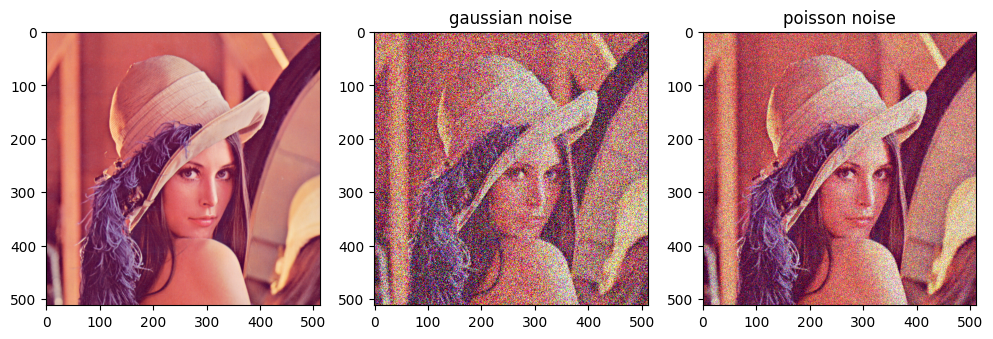

In [13]:
np.random.seed(42)
def gaussian_noise(img, sigma):
    return np.clip(img + np.random.randn(*img.shape)*sigma,0,1)

def poisson_noise(img, scale):
    return np.clip(np.random.poisson(img * scale) / scale,0,1)

# np.save('lena_gaussian.npy',gaussian_noise(lena,0.3))
# np.save('lena_poisson.npy',poisson_noise(lena,255))
assert np.allclose(np.load('lena_gaussian.npy'),gaussian_noise(lena,0.3))
assert np.allclose(np.load('lena_poisson.npy'),poisson_noise(lena,255))

plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(lena)
plt.subplot(132)
plt.title('gaussian noise')
plt.imshow(gaussian_noise(lena,0.4))
plt.subplot(133)
plt.title('poisson noise')
plt.imshow(poisson_noise(lena,16))
plt.show()

### 1.4 HOG（这部分内容课上讲的比较快，建议结合代码学习理解特征子建模方案）
接下来，要完成一个方向梯度直方图(Histogram of Oriented Gradients, HOG)特征提取的流程。这是发表于CVPR'05的[Histograms of Oriented Gradients for Human Detection](http://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf)中提出的descriptor，感兴趣可以进一步阅读原论文。

首先，需要从输入图像中通过滑窗的方式得到若干个window_size（一般取$64\times 128$像素），滑窗的大小和步长通过winsize和win_stride来定义。这一节中，您将聚焦于每个window中计算HOG descriptor的方式——最终将不同window的HOG descriptor拼接起来是比较trivial的，这里不再描述。**为方便学习，不妨取一个$64\times 128$的图片进行实验。**

接下来，要将局部特征从cell组成block。每个block中，将cell的descriptor展平后拼接起来作为block的descriptor，并做L2-Hys归一化。这里的L2-Hys归一化是指先做L2 norm的归一化后，将最大值限定在一个threshold内，再做一次L2 norm的归一化。L2 norm的归一化可以写作：
$$
\tilde{v} = \frac{v}{\sqrt{\Vert v\Vert_2^2+\epsilon^2}}
$$
其中$\tilde{v}$是$v$做L2 norm归一化的结果，$\epsilon$是为防止除0而设置的小量（这里可取1e-6）。

注：您这里需要做的是L2-Hys归一化，默认threshold=0.2；归一化的是block中的cell_per_block $\times$ cell_per_block个cell的descriptor拼接起来的向量。

cell组成block的过程类似于滑窗，通过block_stride参数控制。block_stride==cell_size的情况如下图所示：

<img src="hog_illu.jpg" style="zoom:33%;" />

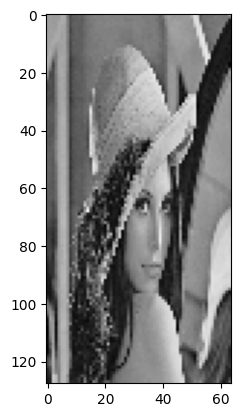

In [14]:
import cv2
import numpy as np
# 设置超参数
cell_size = 4 # cell的长宽(这里的超参数单位均为像素)
block_stride = 4 # block滑窗的stride 
bin_size = 12 # 将0~360°分成bin_size个bin，用于统计直方图
block_size = 12
winsize = (64,128)
# 灰度化、gamma校正(optional)
assert block_stride % cell_size == 0
img = cv2.resize(cv2.imread('lena.jpg', cv2.IMREAD_GRAYSCALE), winsize, interpolation=cv2.INTER_LANCZOS4)/255.#**(1/2)
plt.imshow(img, 'gray')

def render_gradient(cell_gradient, angle_unit):
    # 用于可视化的函数，无需更改
    plt.figure(figsize=(8,8))
    zoom_in = 5
    image = np.zeros((cell_gradient.shape[0] * cell_size * zoom_in, cell_gradient.shape[1] * cell_size * zoom_in))
    cell_width = cell_size / 2
    cell_gradient /= max(np.max(cell_gradient),1e-10) # normalize
    for i in range(1,cell_gradient.shape[0]):
        for j in range(1,cell_gradient.shape[1]):
            angle = 0
            for magnitude in cell_gradient[i][j]:
                angle_radian = np.radians(angle)
                i1 = int((i+.5) * cell_size + magnitude * cell_width * np.sin(angle_radian))
                j1 = int((j+.5) * cell_size + magnitude * cell_width * np.cos(angle_radian))
                i2 = int((i+.5) * cell_size - magnitude * cell_width * np.sin(angle_radian))
                j2 = int((j+.5) * cell_size - magnitude * cell_width * np.cos(angle_radian))
                cv2.line(image, (zoom_in * j1, zoom_in * i1), (zoom_in * j2, zoom_in * i2), int(255 * magnitude),2)
                angle += angle_unit

    plt.imshow(image,'gray')
    plt.show()
    return

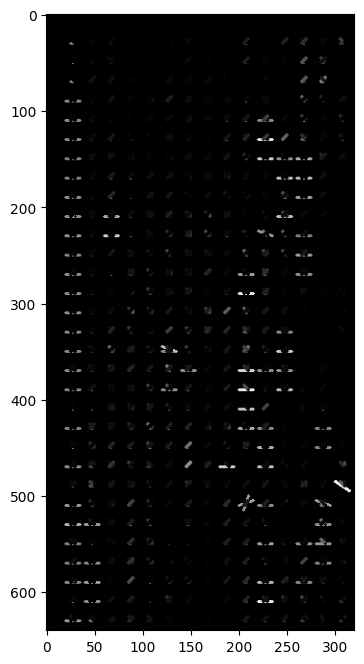

In [15]:
class HOGDescriptorCustom:
    def __init__(self, winsize: tuple, block_size:int, block_stride:int, cell_size:int, bin_size:int):
        self.winsize = winsize
        self.block_size = block_size
        self.block_stride = block_stride
        self.cell_size = cell_size
        self.bin_size = bin_size
        self.angle_unit = 360. / self.bin_size # signed gradients

    def __call__(self, img, debug=False):
        height, width = img.shape
        assert self.winsize == (width,height) # For simplicity, assuming there is only one window in the image.
        cell_per_block = self.block_size // self.cell_size
        # 使用ksize=1的sobel算子计算梯度(0.5')，并计算梯度强度gradient magnitude和梯度的角度（使用角度制）(0.5')
        gradient_values_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=1)
        gradient_values_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=1)
        gradient_magnitude, gradient_angle = cv2.cartToPolar(gradient_values_x, gradient_values_y, angleInDegrees=True)#phase_magnitude(gradient_values_x, gradient_values_y)
        # print(gradient_angle[:16,:16])
        # print(gradient_angle.max())
        # 每个小cell中，根据gradient magnitude加权，统计对应区域的gradient angle的直方图
        # 每个像素的gradient angle只会将它的magnitude线性加权影响最近的两个bin (1')
        cell_gradient_vector = np.zeros((int(height / self.cell_size), int(width / self.cell_size), self.bin_size))
        idx = np.floor(gradient_angle / self.angle_unit).astype(int)
        mod = (gradient_angle - idx * self.angle_unit) / self.angle_unit
        add1 = (1-mod) * gradient_magnitude
        add2 = mod * gradient_magnitude

        for i in range(cell_gradient_vector.shape[0]):
            for j in range(cell_gradient_vector.shape[1]):
                np.add.at(cell_gradient_vector[i,j],
                    (idx[i*self.cell_size:(i+1)*self.cell_size, j*self.cell_size:(j+1)*self.cell_size]%self.bin_size),
                    add1[i*self.cell_size:(i+1)*self.cell_size, j*self.cell_size:(j+1)*self.cell_size])
                np.add.at(cell_gradient_vector[i,j],
                    ((idx[i*self.cell_size:(i+1)*self.cell_size, j*self.cell_size:(j+1)*self.cell_size]+1)%self.bin_size),
                    add2[i*self.cell_size:(i+1)*self.cell_size, j*self.cell_size:(j+1)*self.cell_size])
        if debug:
            render_gradient(cell_gradient_vector, self.angle_unit)
        hog_vector = []
        # 从每个cell的gradient vector聚集得到block的vector (1'), 请注意normalization
        for i in range(0,cell_gradient_vector.shape[0] - cell_per_block+1,self.block_stride//self.cell_size):
            for j in range(0,cell_gradient_vector.shape[1] - cell_per_block+1,self.block_stride//self.cell_size):
                block_vector = (cell_gradient_vector[i:i+cell_per_block,j:j+cell_per_block]).ravel()
                magnitude = np.sum(block_vector**2)**0.5
                block_vector /= (magnitude+1e-6)
                block_vector = np.clip(block_vector, 0, 0.2)
                magnitude = np.sum(block_vector**2)**0.5
                block_vector /= (magnitude+1e-6)
                hog_vector.append(block_vector)
        hog_vector = np.array(hog_vector).ravel()
        return hog_vector

hog_custom = HOGDescriptorCustom(winsize,block_size,block_stride,cell_size,bin_size)
hog_vector_custom = hog_custom(
    cv2.resize(cv2.imread('lena.jpg', cv2.IMREAD_GRAYSCALE), winsize, interpolation=cv2.INTER_LANCZOS4),debug=True
)

具体实现可能与opencv的库的实现略有不同，结果存在差异是正常的，但对同一张图片提取的特征向量shape是一样的。

In [16]:
hog_cv2 = cv2.HOGDescriptor(
    winsize,
    (block_size,block_size),
    (block_stride,block_stride),
    (cell_size,cell_size),
    _nbins=bin_size,
    _signedGradient = True
)
hog_vector_cv2=(hog_cv2.compute(
     cv2.resize(cv2.imread('lena.jpg', cv2.IMREAD_GRAYSCALE), winsize, interpolation=cv2.INTER_LANCZOS4)
    ))

assert hog_vector_cv2.shape==hog_vector_custom.shape

## 3 图像分类

针对sklearn自带的人脸数据集的识别任务，利用HOG特征作为图像的特征描述符进行分类

提示：最终提取的特征描述符维度过大，需要考虑用PCA降维后再训练分类器

### 3.1 读取图像数据

In [17]:
import cv2
import numpy as np
import sklearn
from sklearn import datasets

faces = sklearn.datasets.fetch_olivetti_faces(download_if_missing=True)  # 人脸数据集
imgs = faces.images
labels = faces.target

print(imgs.shape)
print(labels.shape)

(400, 64, 64)
(400,)


### 3.2 预处理

这一部分，你需要完成训练数据的预处理。

1. 使用刚刚实现的、用于提取HOG特征的类，对图像进行特征提取；也可以用opencv提供的其它提取特征的算子

2. 同时也要知道，并不是把一大堆非常高维的数据扔给机器学习，机器就能在测试集上表现很好的，况且还会拖慢执行速度（这就是数据降维的重要性）。

3. 在分离训练数据与测试数据时，注意这里指定stratify=labels，保证训练和测试每一类都出现过。同时这里设置了test_size=0.5，可以看出用于训练的数据相对于测试数据还是比较少的。

In [18]:
# HOG特征
# hog_descriptors 为提取得到的图像hog特征
# code:
# !pip uninstall opencv-python
# !pip install opencv-contrib-python
import sklearn.model_selection, sklearn.decomposition

hog_custom = HOGDescriptorCustom((64,64),16,8,8,16)
# hog_descriptors = np.array([hog_cv2.compute((img*255).astype(np.uint8)) for img in imgs])
np.random.seed(42)
# xtrain, xtest, ytrain, ytest = sklearn.model_selection.train_test_split(imgs.reshape(400,-1),labels,stratify=labels)
xtrain, xtest, ytrain, ytest = sklearn.model_selection.train_test_split(imgs,labels,test_size=0.5,stratify=labels)
xtrain = np.concatenate([[
    hog_custom(img),
    # hog_cv2.compute(np.uint8(img*255)),
    # hog_custom(img[::-1]),
    hog_custom(img[:,::-1]),

] for img in xtrain])
# xtrain = np.array([hog_custom(img) for img in xtrain])
ytrain = np.repeat(ytrain,len(xtrain)//len(ytrain))
print(ytrain.shape)
# xtest = np.array([hog_cv2.compute(np.uint8(255*img)) for img in xtest])
xtest = np.array([hog_custom(img) for img in xtest])
print(xtrain.shape)
from sklearn import decomposition
pca=decomposition.PCA(100,svd_solver='auto')
pca.fit(xtrain)
xtest = pca.transform(xtest)
xtrain = pca.transform(xtrain)

(400,)
(400, 3136)


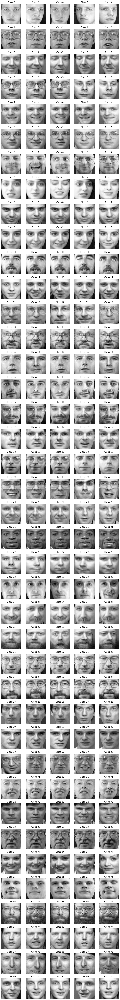

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

# ==================== 终极简单版（自动处理所有问题） ====================

# 1. 显示每个类别的前5张图片
def show_samples(imgs, labels):
    unique_labels = np.unique(labels)
    fig, axes = plt.subplots(len(unique_labels), 5, figsize=(10, 2*len(unique_labels)))
    
    for i, label in enumerate(unique_labels):
        class_indices = np.where(labels == label)[0][:5]
        for j, idx in enumerate(class_indices):
            axes[i, j].imshow(imgs[idx], cmap='gray')
            axes[i, j].set_title(f'Class {label}')
            axes[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()

# 显示样本
show_samples(imgs, labels)


### 3.3 分类

实现一个分类器，完成人脸分类任务

1. 使用[SVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)或者opencv中的其它传统机器学习算法进行分类，将测试集的分类结果存入test_result中

有基础的同学也可以尝试对比深度学习网络模型

2. 得到混淆矩阵([confusion matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html))，并用[seaborn.heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.html)进行展示，如结果图
3. 计算Precision、Recall和F1-score的代码已完成，有兴趣的同学可以[进一步](https://en.wikipedia.org/wiki/Precision_and_recall)了解这三个指标的含义。

注：作为参考，在这个任务（一半数据用于测试）一般三个指标都在0.9以上算“正常水平”。

原始图像形状: (400, 64, 64)
标签形状: (400,)
训练集: 200 样本, 测试集: 200 样本

========== scikit-learn SVM ==========
Precision (macro): 0.8841
Recall    (macro): 0.8550
F1-score  (macro): 0.8517


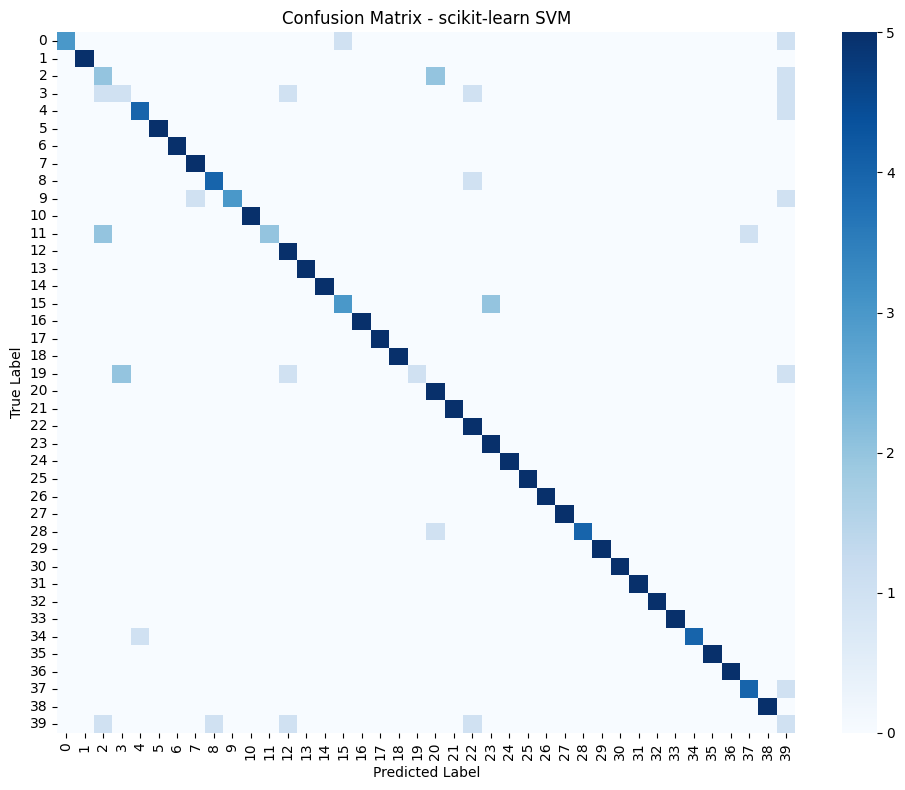


========== OpenCV SVM ==========
Precision (macro): 0.7031
Recall    (macro): 0.4150
F1-score  (macro): 0.4815


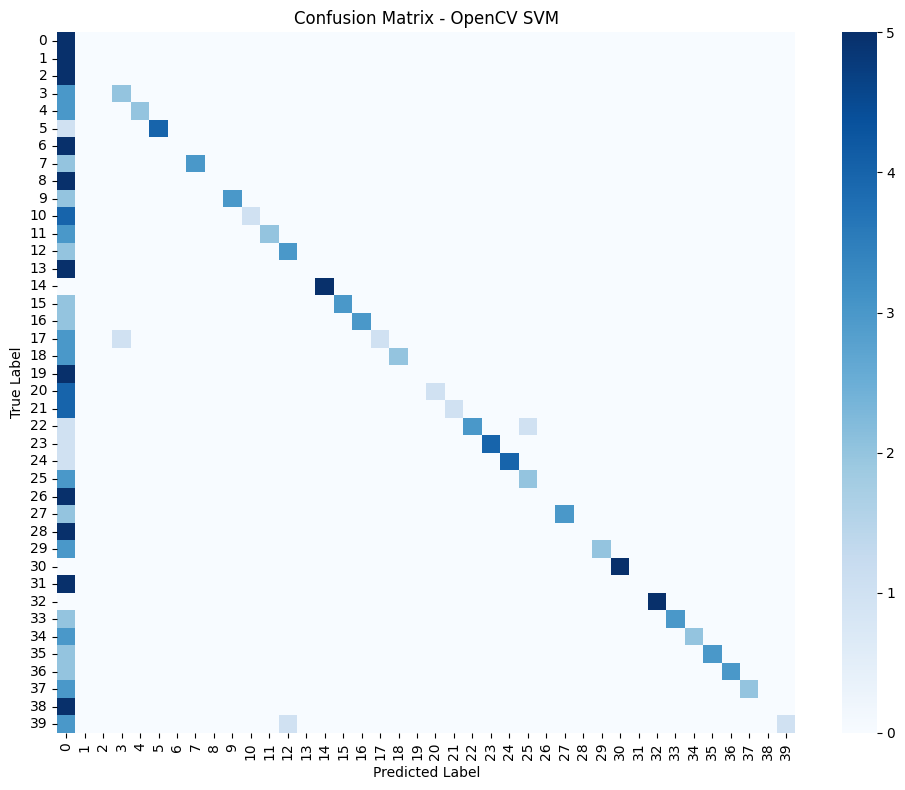


========== KNN (k=5) ==========
Precision (macro): 0.8035
Recall    (macro): 0.7350
F1-score  (macro): 0.7260


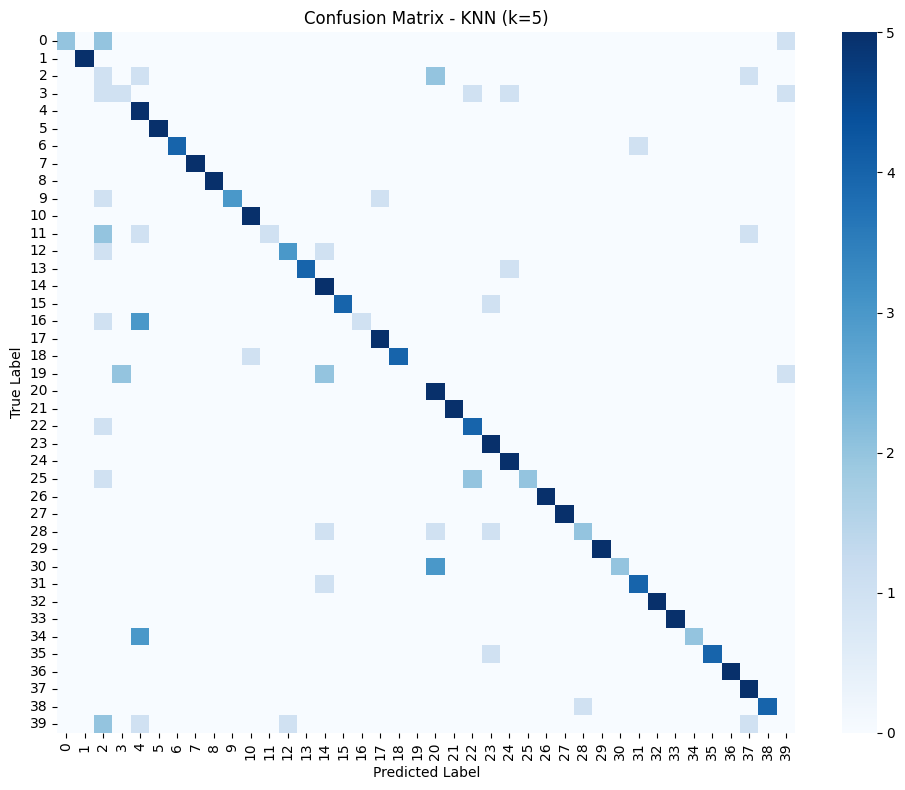


========== Random Forest ==========
Precision (macro): 0.9275
Recall    (macro): 0.9100
F1-score  (macro): 0.9064


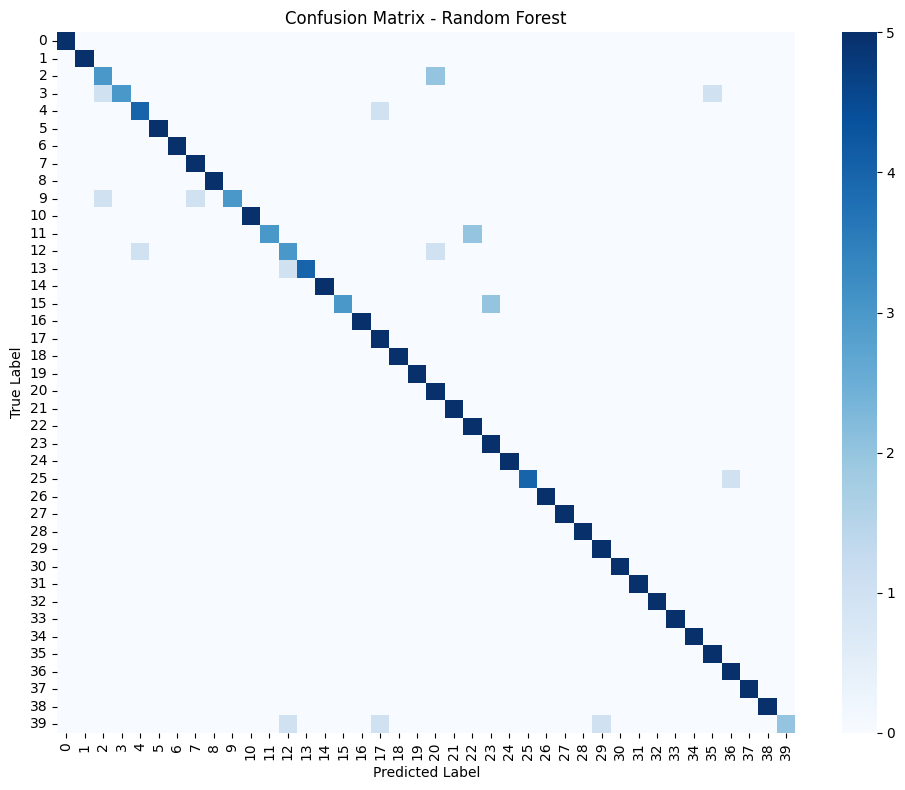


========== Logistic Regression ==========
Precision (macro): 0.9540
Recall    (macro): 0.9450
F1-score  (macro): 0.9433


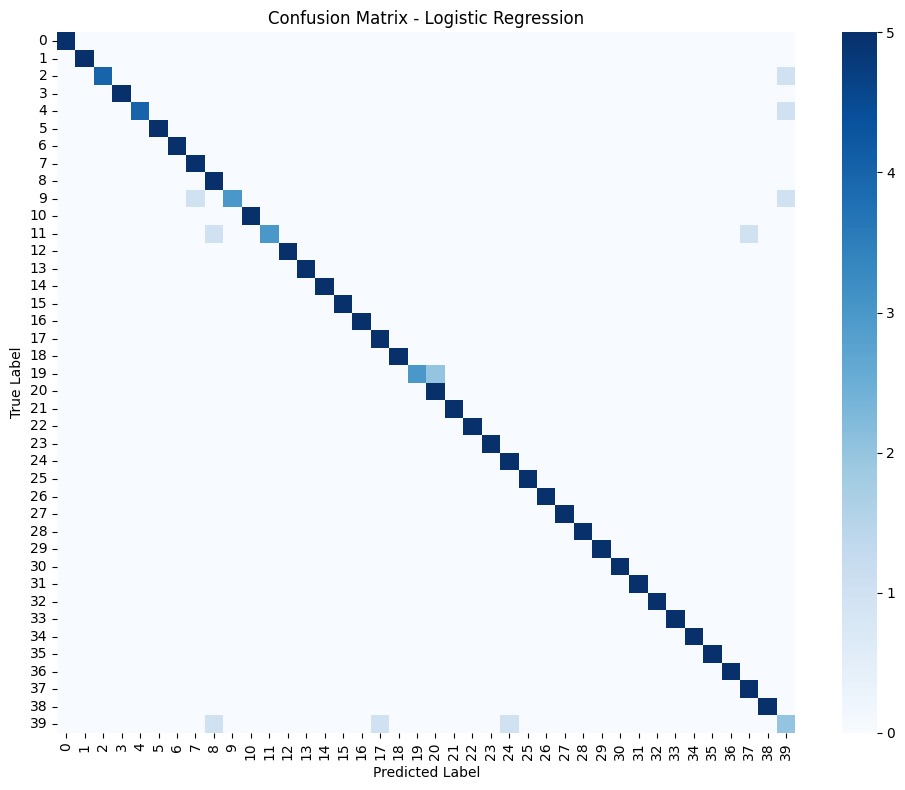


========== Decision Tree ==========
Precision (macro): 0.5723
Recall    (macro): 0.5250
F1-score  (macro): 0.5144


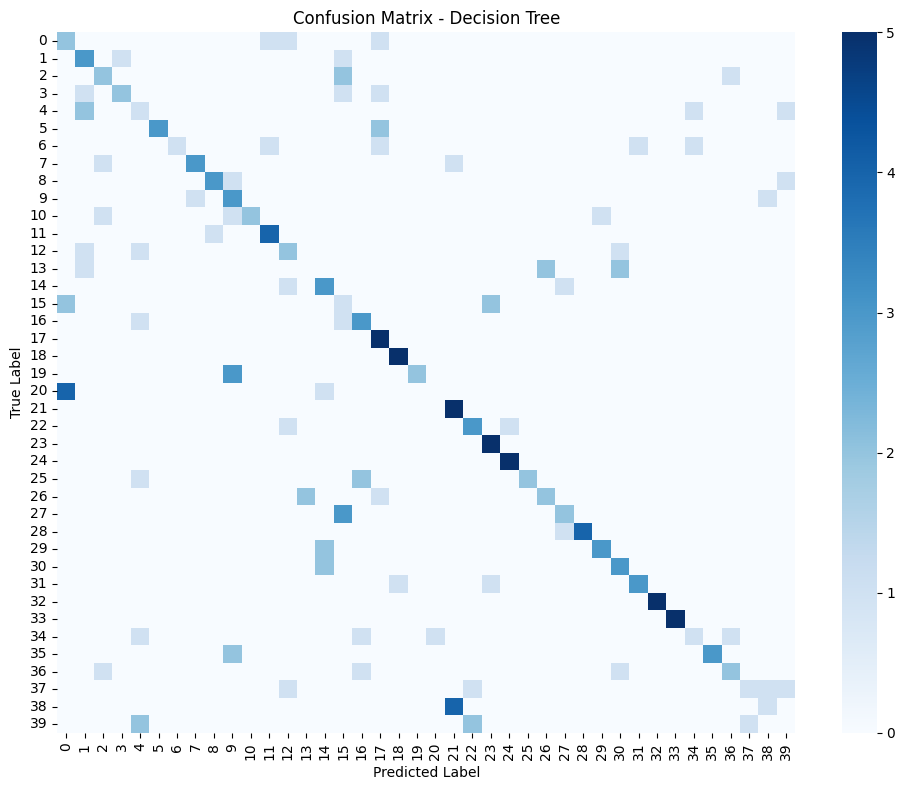


===== 所有算法的 test_result 变量已存储 =====
test_result_svm_sklearn, test_result_svm_opencv, test_result_knn,
test_result_rf, test_result_lr, test_result_dt


In [20]:
# todo： 
import cv2
import numpy as np
import sklearn
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# ==================== 1. 加载数据并预处理 ====================
faces = sklearn.datasets.fetch_olivetti_faces(download_if_missing=True)
imgs = faces.images          # (400, 64, 64)
labels = faces.target        # (400,)

print("原始图像形状:", imgs.shape)
print("标签形状:", labels.shape)

# 将图像展平为向量 (400, 4096)
X = imgs.reshape(imgs.shape[0], -1)
y = labels

# 划分训练集和测试集（一半测试）
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.5, random_state=42, stratify=y
)
print(f"训练集: {X_train.shape[0]} 样本, 测试集: {X_test.shape[0]} 样本")

# 标准化（大部分算法需要）
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# OpenCV SVM 需要 float32 类型的数据
X_train_32 = X_train_scaled.astype(np.float32)
X_test_32 = X_test_scaled.astype(np.float32)
y_train_32 = y_train.astype(np.int32)
y_test_32 = y_test.astype(np.int32)

# ==================== 2. 定义评估函数 ====================
def evaluate_model(name, y_true, y_pred):
    """计算并打印模型的精度、召回率、F1，并绘制混淆矩阵热力图"""
    cm = confusion_matrix(y_true, y_pred)
    # 宏观平均指标
    precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
    
    print(f"\n========== {name} ==========")
    print(f"Precision (macro): {precision:.4f}")
    print(f"Recall    (macro): {recall:.4f}")
    print(f"F1-score  (macro): {f1:.4f}")
    
    # 绘制热力图（类别太多，不显示数字，只展示颜色）
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=False, cmap='Blues', cbar=True)
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()
    
    return precision, recall, f1

# ==================== 3. 算法1：scikit-learn SVM (RBF核) ====================
svm_sklearn = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
svm_sklearn.fit(X_train_scaled, y_train)
test_result_svm_sklearn = svm_sklearn.predict(X_test_scaled)
evaluate_model("scikit-learn SVM", y_test, test_result_svm_sklearn)

# ==================== 4. 算法2：OpenCV SVM ====================
# 创建 OpenCV SVM 对象
svm_opencv = cv2.ml.SVM_create()
svm_opencv.setType(cv2.ml.SVM_C_SVC)           # C-支持向量分类
svm_opencv.setKernel(cv2.ml.SVM_RBF)           # RBF核
svm_opencv.setC(1.0)
svm_opencv.setGamma(0.01)                     # gamma 需要手动指定（scikit-learn 的 'scale' 对应 1/(n_features*X.var())）
# 训练
svm_opencv.train(X_train_32, cv2.ml.ROW_SAMPLE, y_train_32)
# 预测
_, test_result_svm_opencv = svm_opencv.predict(X_test_32)
test_result_svm_opencv = test_result_svm_opencv.flatten().astype(int)
evaluate_model("OpenCV SVM", y_test, test_result_svm_opencv)

# ==================== 5. 算法3：K-近邻 (K=5) ====================
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
test_result_knn = knn.predict(X_test_scaled)
evaluate_model("KNN (k=5)", y_test, test_result_knn)

# ==================== 6. 算法4：随机森林 (100棵树) ====================
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)
test_result_rf = rf.predict(X_test_scaled)
evaluate_model("Random Forest", y_test, test_result_rf)

# ==================== 7. 算法5：逻辑回归 (最大迭代增加) ====================
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train_scaled, y_train)
test_result_lr = lr.predict(X_test_scaled)
evaluate_model("Logistic Regression", y_test, test_result_lr)

# ==================== 8. 算法6：决策树 ====================
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train_scaled, y_train)
test_result_dt = dt.predict(X_test_scaled)
evaluate_model("Decision Tree", y_test, test_result_dt)

# ==================== 9. 所有结果汇总 ====================
print("\n===== 所有算法的 test_result 变量已存储 =====")
print("test_result_svm_sklearn, test_result_svm_opencv, test_result_knn,")
print("test_result_rf, test_result_lr, test_result_dt")


In [21]:
# 在原有代码基础上，继续添加深度学习部分
# 需要安装 tensorflow: pip install tensorflow
!pip install tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 前面已经加载了 imgs, labels，并且划分了训练测试集（展平前的数据）
# 注意：CNN 需要原始图像尺寸，不需要展平，因此我们重新加载原始图像并划分（保证与之前划分一致）

# 重新加载数据（确保数据一致性）
faces = sklearn.datasets.fetch_olivetti_faces(download_if_missing=True)
imgs = faces.images          # (400, 64, 64) 已经是 float64, 范围 0~1
labels = faces.target

# 使用相同的 random_state 划分，保证与之前传统方法的训练/测试集相同
from sklearn.model_selection import train_test_split
X_train_img, X_test_img, y_train, y_test = train_test_split(
    imgs, labels, test_size=0.5, random_state=42, stratify=labels
)

# 为 CNN 增加通道维度 (64,64) -> (64,64,1)
X_train_cnn = X_train_img[..., np.newaxis]   # (200, 64, 64, 1)
X_test_cnn = X_test_img[..., np.newaxis]     # (200, 64, 64, 1)

# 将标签转为 one-hot 编码（用于 categorical_crossentropy）
y_train_cat = to_categorical(y_train, num_classes=40)
y_test_cat = to_categorical(y_test, num_classes=40)

# 构建简单的 CNN 模型
model = Sequential([
    Input(shape=(64, 64, 1)),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(40, activation='softmax')
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# 早停，防止过拟合
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# 训练
history = model.fit(X_train_cnn, y_train_cat,
                    epochs=100,
                    batch_size=16,
                    validation_split=0.2,
                    callbacks=[early_stop],
                    verbose=1)

# 预测测试集
y_pred_cnn_proba = model.predict(X_test_cnn)
y_pred_cnn = np.argmax(y_pred_cnn_proba, axis=1)

# 评估 CNN 模型
def evaluate_cnn(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
    
    print("\n========== CNN (Deep Learning) ==========")
    print(f"Precision (macro): {precision:.4f}")
    print(f"Recall    (macro): {recall:.4f}")
    print(f"F1-score  (macro): {f1:.4f}")
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=False, cmap='Blues', cbar=True)
    plt.title('Confusion Matrix - CNN')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()
    
    # 绘制训练曲线
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.title('Loss Curves')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='train_acc')
    plt.plot(history.history['val_accuracy'], label='val_acc')
    plt.title('Accuracy Curves')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return precision, recall, f1

evaluate_cnn(y_test, y_pred_cnn)

# 可选：保存 test_result_cnn 变量
test_result_cnn = y_pred_cnn
print("test_result_cnn 已保存")

: 

留一个选做题：尝试在图片中加入肉眼不太明显的噪声，以大幅降低分类器的效果

您可以用markdown在这里写下您的答案，也可以在下面继续进行一些实验来验证你的想法。



## 一、基本原理

对于一张人脸图像 \(x\)（真实类别 \(y_{\text{true}}\)），分类器输出 \(f(x)\)。目标是找到一个微小的扰动 \(\delta\)，满足：

**约束条件**（保证扰动几乎不可见）：

\[
\|\delta\|_\infty \le \epsilon \quad (\text{例如 } \epsilon = \frac{8}{255})
\]

使得扰动后的图像 \(x_{\text{adv}} = x + \delta\) 在视觉上与 \(x\) 几乎无差别。

**攻击目标**：

- **无目标攻击**：\(f(x_{\text{adv}}) \neq y_{\text{true}}\)
- **有目标攻击**：\(f(x_{\text{adv}}) = y_{\text{target}}\)

扰动 \(\delta\) 通过 **最大化损失函数** 来求解：

\[
\delta = \arg\max_{\|\delta\|_\infty \le \epsilon} L\bigl(f(x+\delta),\; y_{\text{true}}\bigr)
\]

其中 \(L(\cdot, \cdot)\) 是分类器的损失函数。

---

## 二、FGSM（Fast Gradient Sign Method）原理

**FGSM** 是由 Goodfellow 等人在 2015 年提出的单步对抗攻击方法。核心思想：**沿着损失函数梯度增加最快的方向添加扰动**。

### 1. 计算梯度
首先计算损失函数 \(L\) 关于输入图像 \(x\) 的梯度：

\[
\nabla_x L\bigl(f(x), y_{\text{true}}\bigr)
\]

该梯度的方向指示了使损失 **增大最快** 的方向。

### 2. 生成扰动
FGSM 直接取梯度的符号，并按步长 \(\epsilon\) 缩放：

\[
\delta = \epsilon \cdot \operatorname{sign}\bigl(\nabla_x L(f(x), y_{\text{true}})\bigr)
\]

### 3. 生成对抗样本

\[
x_{\text{adv}} = x + \epsilon \cdot \operatorname{sign}\bigl(\nabla_x L(f(x), y_{\text{true}})\bigr)
\]

最后裁剪到有效像素范围（如 \([0,1]\)）。

### 关键特点
- **单步计算**：只做一次反向传播，速度快。
- **扰动幅度固定**：每个像素的改动最多 \(\epsilon\)（\(L_\infty\) 约束）。
- **效果**：对未防御的模型能显著降低准确率，但可能不是最优扰动。

---

## 三、PGD（Projected Gradient Descent）原理

**PGD** 是 Madry 等人在 2018 年提出的迭代式攻击方法，可以看作 FGSM 的多步、投影版本。它能找到更强（更坏）的对抗样本。

### 1. 初始化
从原始图像 \(x^{(0)} = x\) 开始，或加上随机噪声。

### 2. 迭代更新
对每一步 \(t = 0, 1, \ldots, T-1\)：

\[
x^{(t+1)} = \Pi_{B_\infty(x, \epsilon)} \left( x^{(t)} + \alpha \cdot \operatorname{sign}\bigl(\nabla_{x^{(t)}} L(f(x^{(t)}), y_{\text{true}})\bigr) \right)
\]

其中：
- \(\alpha\) 是步长（通常较小，如 \(\epsilon/10\)）。
- \(\Pi_{B_\infty(x, \epsilon)}(\cdot)\) 是投影算子，将扰动后的图像投影回以 \(x\) 为中心、半径为 \(\epsilon\) 的 \(L_\infty\) 球内，并裁剪像素到合法范围（如 \([0,1]\)）。

### 3. 最终输出
经过 \(T\) 次迭代后，\(x^{(T)}\) 即为对抗样本 \(x_{\text{adv}}\)。

### 关键特点
- **迭代优化**：多步小步移动，能更精确地逼近使损失最大的点。
- **投影保证**：每次更新后都保证扰动不超过 \(\epsilon\)，满足不可见性约束。
- **强攻击能力**：PGD 通常比 FGSM 杀伤力大得多，是评估模型鲁棒性的常用基准。

---

## 四、FGSM 与 PGD 的直观对比

| 特性 | FGSM | PGD |
|------|------|-----|
| 步数 | 1 | 多步（如 10~40） |
| 扰动方向 | 单次符号梯度 | 每步重新计算梯度 |
| 投影操作 | 无（最后直接剪裁） | 每步投影到 \(L_\infty\) 球 |
| 攻击强度 | 中 | 高（接近最优） |
| 计算成本 | 低 | 高 |
| 典型用途 | 快速测试，基线 | 模型鲁棒性评估，对抗训练 |


1. 加载数据并划分训练集/测试集...

2. 创建并训练 CNN 模型...
Epoch [10/30], Loss: 1.6037
Epoch [20/30], Loss: 0.3378
Epoch [30/30], Loss: 0.1140

3. 评估模型在干净测试集上的性能...
Test Accuracy: 94.17%

4. 评估 FGSM 攻击效果...
FGSM Attack (ε=0.03) Accuracy: 55.83%

5. 评估 PGD 攻击效果...
PGD Attack (ε=0.03) Accuracy: 31.67%

最终结果汇总:
  干净测试集准确率: 94.17%
  FGSM 攻击后准确率: 55.83%
  PGD 攻击后准确率: 31.67%

6. 展示对抗样本可视化...


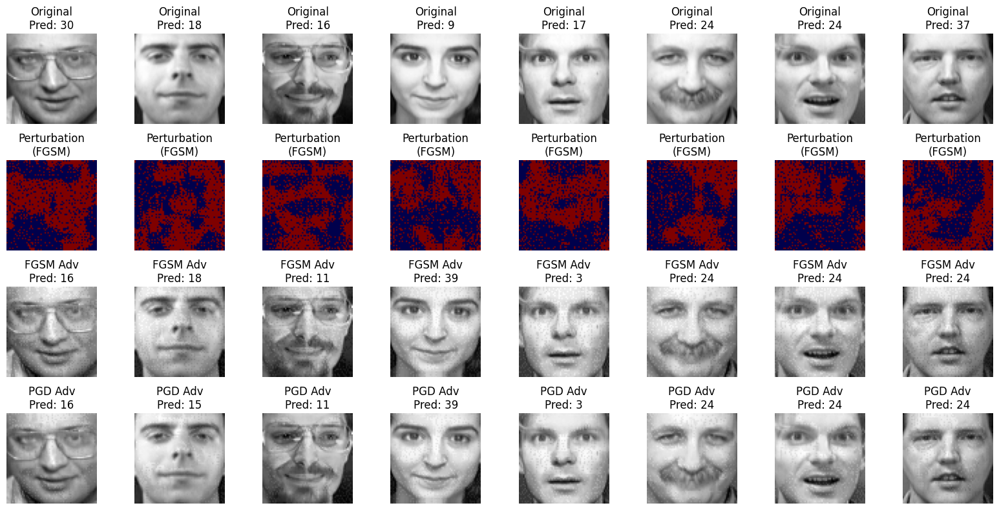

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import fetch_olivetti_faces
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------
# 1. 数据加载与预处理
# ------------------------------
def load_and_prepare_data():
    faces = fetch_olivetti_faces(shuffle=True, random_state=42)
    X = faces.images.reshape(-1, 1, 64, 64)   # (400, 1, 64, 64)
    y = faces.target

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )

    # 转为 PyTorch Tensor
    X_train_t = torch.FloatTensor(X_train)
    y_train_t = torch.LongTensor(y_train)
    X_test_t = torch.FloatTensor(X_test)
    y_test_t = torch.LongTensor(y_test)

    train_loader = DataLoader(TensorDataset(X_train_t, y_train_t), batch_size=32, shuffle=True)
    test_loader = DataLoader(TensorDataset(X_test_t, y_test_t), batch_size=32, shuffle=False)
    return train_loader, test_loader

# ------------------------------
# 2. 定义轻量级 CNN
# ------------------------------
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=40):
        super().__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                # 32x32
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                # 16x16
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                # 8x8
        )
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 8 * 8, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# ------------------------------
# 3. 模型训练函数
# ------------------------------
def train_model(model, train_loader, epochs=30, lr=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}')
    return model

# ------------------------------
# 4. 测试模型准确率
# ------------------------------
def test_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    print(f'Test Accuracy: {accuracy:.2f}%')
    return accuracy

# ------------------------------
# 5. FGSM 攻击
# ------------------------------
def fgsm_attack(model, images, labels, epsilon=0.03):
    """
    快速梯度符号法 (Fast Gradient Sign Method)
    epsilon: 扰动幅度，值越小越不易察觉，值越大攻击越强
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    images = images.to(device)
    labels = labels.to(device)

    # 获取原始梯度方向
    images.requires_grad = True
    outputs = model(images)
    loss = nn.CrossEntropyLoss()(outputs, labels)
    loss.backward()

    # 沿着梯度符号方向添加扰动
    perturbed_images = images + epsilon * images.grad.sign()
    perturbed_images = torch.clamp(perturbed_images, 0, 1)  # 保持像素值在 [0,1]

    return perturbed_images

def test_fgsm(model, test_loader, epsilon=0.03):
    """
    在测试集上评估 FGSM 攻击的效果
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    correct = 0
    total = 0

    for images, labels in test_loader:
        # 生成对抗样本
        perturbed_images = fgsm_attack(model, images, labels, epsilon)

        # 测试对抗样本
        with torch.no_grad():
            outputs = model(perturbed_images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels.to(device)).sum().item()

    accuracy = 100 * correct / total
    print(f'FGSM Attack (ε={epsilon}) Accuracy: {accuracy:.2f}%')
    return accuracy

# ------------------------------
# 6. PGD 攻击（迭代式，更强）
# ------------------------------
def pgd_attack(model, images, labels, epsilon=0.03, alpha=0.005, num_iter=10):
    """
    投影梯度下降 (Projected Gradient Descent)
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    images = images.to(device)
    labels = labels.to(device)

    # 复制干净图像作为起始点
    perturbed_images = images.clone().detach().requires_grad_(True)

    for _ in range(num_iter):
        outputs = model(perturbed_images)
        loss = nn.CrossEntropyLoss()(outputs, labels)

        # 清零梯度并反向传播
        if perturbed_images.grad is not None:
            perturbed_images.grad.zero_()
        loss.backward()

        # 沿梯度符号方向移动
        with torch.no_grad():
            perturbed_images = perturbed_images + alpha * perturbed_images.grad.sign()
            # 投影到 epsilon 球内
            eta = torch.clamp(perturbed_images - images, min=-epsilon, max=epsilon)
            perturbed_images = torch.clamp(images + eta, 0, 1).detach().requires_grad_(True)

    return perturbed_images

def test_pgd(model, test_loader, epsilon=0.03):
    """
    在测试集上评估 PGD 攻击的效果
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    correct = 0
    total = 0

    for images, labels in test_loader:
        perturbed_images = pgd_attack(model, images, labels, epsilon)
        with torch.no_grad():
            outputs = model(perturbed_images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels.to(device)).sum().item()

    accuracy = 100 * correct / total
    print(f'PGD Attack (ε={epsilon}) Accuracy: {accuracy:.2f}%')
    return accuracy

# ------------------------------
# 7. 可视化对抗样本
# ------------------------------
def visualize_adversarial_examples(model, test_loader, epsilon=0.03):
    """
    可视化原始图像、FGSM扰动、FGSM对抗样本和PGD对抗样本
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    # 取一批数据
    images, labels = next(iter(test_loader))
    images = images.to(device)
    labels = labels.to(device)

    # 生成对抗样本
    fgsm_adv = fgsm_attack(model, images, labels, epsilon)
    pgd_adv = pgd_attack(model, images, labels, epsilon)

    # 显示前8个样本
    fig, axes = plt.subplots(4, 8, figsize=(16, 8))
    for i in range(8):
        # 原始图像
        axes[0, i].imshow(images[i, 0].cpu().detach().numpy(), cmap='gray')
        axes[0, i].set_title(f'Original\nPred: {torch.argmax(model(images[i:i+1]), dim=1).item()}')
        axes[0, i].axis('off')

        # FGSM 扰动（放大10倍便于观察）
        perturbation = fgsm_adv[i, 0] - images[i, 0]
        axes[1, i].imshow(perturbation.cpu().detach().numpy() * 10, cmap='seismic')
        axes[1, i].set_title('Perturbation\n(FGSM)')
        axes[1, i].axis('off')

        # FGSM 对抗样本
        axes[2, i].imshow(fgsm_adv[i, 0].cpu().detach().numpy(), cmap='gray')
        pred = torch.argmax(model(fgsm_adv[i:i+1]), dim=1).item()
        axes[2, i].set_title(f'FGSM Adv\nPred: {pred}')
        axes[2, i].axis('off')

        # PGD 对抗样本
        axes[3, i].imshow(pgd_adv[i, 0].cpu().detach().numpy(), cmap='gray')
        pred = torch.argmax(model(pgd_adv[i:i+1]), dim=1).item()
        axes[3, i].set_title(f'PGD Adv\nPred: {pred}')
        axes[3, i].axis('off')

    plt.tight_layout()
    plt.show()

# ------------------------------
# 8. 主函数：完整流程
# ------------------------------
def main():
    print("=" * 50)
    print("1. 加载数据并划分训练集/测试集...")
    train_loader, test_loader = load_and_prepare_data()

    print("\n2. 创建并训练 CNN 模型...")
    model = SimpleCNN(num_classes=40)
    model = train_model(model, train_loader, epochs=30)

    print("\n3. 评估模型在干净测试集上的性能...")
    clean_acc = test_model(model, test_loader)

    print("\n4. 评估 FGSM 攻击效果...")
    fgsm_acc = test_fgsm(model, test_loader, epsilon=0.03)

    print("\n5. 评估 PGD 攻击效果...")
    pgd_acc = test_pgd(model, test_loader, epsilon=0.03)

    print("\n" + "=" * 50)
    print("最终结果汇总:")
    print(f"  干净测试集准确率: {clean_acc:.2f}%")
    print(f"  FGSM 攻击后准确率: {fgsm_acc:.2f}%")
    print(f"  PGD 攻击后准确率: {pgd_acc:.2f}%")
    print("=" * 50)

    # 可视化对抗样本
    print("\n6. 展示对抗样本可视化...")
    visualize_adversarial_examples(model, test_loader, epsilon=0.03)

if __name__ == "__main__":
    main()

# 对抗噪声方法&优化方法
1.可用arcface让不同类别
2.生成噪声覆盖后的样本加入训练集让模型更稳定

加载数据...

===== 普通训练 (无对抗) =====
Epoch   5 | Loss: 0.0273 | Clean Acc: 70.83%
Epoch  10 | Loss: 0.0018 | Clean Acc: 98.33%
Epoch  15 | Loss: 0.0004 | Clean Acc: 98.33%
Epoch  20 | Loss: 0.0006 | Clean Acc: 98.33%
Epoch  25 | Loss: 0.0006 | Clean Acc: 98.33%
Epoch  30 | Loss: 0.0005 | Clean Acc: 98.33%

===== 对抗训练 (PGD 防御) =====
Epoch   5 | Loss: 12.7613 | Clean Acc: 95.00%
Epoch  10 | Loss: 3.6993 | Clean Acc: 99.17%
Epoch  15 | Loss: 2.1635 | Clean Acc: 98.33%
Epoch  20 | Loss: 0.9159 | Clean Acc: 100.00%
Epoch  25 | Loss: 0.9068 | Clean Acc: 99.17%
Epoch  30 | Loss: 0.8401 | Clean Acc: 99.17%

========== 最终评估 ==========

普通训练:
  干净准确率: 98.33%
  FGSM 攻击后: 83.33%
  PGD 攻击后: 10.83%

对抗训练:
  干净准确率: 99.17%
  FGSM 攻击后: 91.67%
  PGD 攻击后: 90.00%


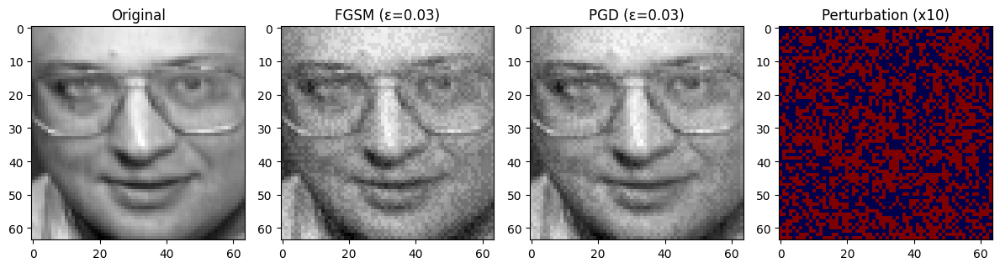

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import fetch_olivetti_faces
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import math
# ------------------------------
# 1. 数据加载
# ------------------------------
def load_data(batch_size=32):
    faces = fetch_olivetti_faces(shuffle=True, random_state=42)
    X = faces.images.reshape(-1, 1, 64, 64)   # (400,1,64,64)
    y = faces.target
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )
    # 转为 Tensor
    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train), torch.LongTensor(y_train)),
                              batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(TensorDataset(torch.FloatTensor(X_test), torch.LongTensor(y_test)),
                             batch_size=batch_size, shuffle=False)
    return train_loader, test_loader

# ------------------------------
# 2. 定义带 ArcFace 损失的 CNN
# ------------------------------
class ArcFaceModel(nn.Module):
    def __init__(self, num_classes=40, feat_dim=128, s=64.0, m=0.5):
        super().__init__()
        self.s = s
        self.m = m
        # 特征提取器
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2),
            nn.Flatten(),
            nn.Linear(128 * 8 * 8, feat_dim),
            nn.BatchNorm1d(feat_dim),
        )
        # 分类权重 (未归一化，forward中会归一化)
        self.W = nn.Linear(feat_dim, num_classes, bias=False)

    def forward(self, x, labels=None):
        # 特征提取 + L2 归一化
        x = self.features(x)
        x = nn.functional.normalize(x, p=2, dim=1)    # feat_dim
        # 归一化权重
        w = nn.functional.normalize(self.W.weight, p=2, dim=1)   # (num_classes, feat_dim)
        cos_theta = nn.functional.linear(x, w)        # (batch, num_classes)

        if self.training and labels is not None:
            # 应用 ArcFace 角度间隔
            # cos(theta + m) = cos(theta)cos(m) - sin(theta)sin(m)
            sin_theta = torch.sqrt(1.0 - torch.clamp(cos_theta, -1.0, 1.0) ** 2)
            cos_theta_m = cos_theta * math.cos(self.m) - sin_theta * math.sin(self.m)
            # 只修改真实类别的 logit
            one_hot = torch.zeros_like(cos_theta).scatter_(1, labels.unsqueeze(1), 1)
            logits = torch.where(one_hot.bool(), cos_theta_m, cos_theta) * self.s
            return logits
        else:
            # 推理时返回余弦相似度 (可直接用于检索)
            return cos_theta

# ------------------------------
# 3. 对抗攻击方法 (FGSM, PGD)
# ------------------------------
def fgsm_attack(model, images, labels, epsilon=0.03):
    images = images.clone().detach().requires_grad_(True)
    logits = model(images, labels)   # 训练模式，传入labels
    loss = nn.CrossEntropyLoss()(logits, labels)
    loss.backward()
    perturbed = images + epsilon * images.grad.sign()
    return torch.clamp(perturbed, 0, 1)

def pgd_attack(model, images, labels, epsilon=0.03, alpha=0.005, steps=10):
    perturbed = images.clone().detach().requires_grad_(True)
    for _ in range(steps):
        logits = model(perturbed, labels)
        loss = nn.CrossEntropyLoss()(logits, labels)
        loss.backward()
        with torch.no_grad():
            perturbed = perturbed + alpha * perturbed.grad.sign()
            # 投影到 L_inf 球
            eta = torch.clamp(perturbed - images, -epsilon, epsilon)
            perturbed = torch.clamp(images + eta, 0, 1).detach().requires_grad_(True)
    return perturbed

# ------------------------------
# 4. 评估函数 (干净 / 对抗)
# ------------------------------
def evaluate(model, test_loader, attack_name=None, epsilon=0.03):
    device = next(model.parameters()).device
    model.eval()
    correct = 0
    total = 0
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        if attack_name == "fgsm":
            adv_images = fgsm_attack(model, images, labels, epsilon)
        elif attack_name == "pgd":
            adv_images = pgd_attack(model, images, labels, epsilon)
        else:
            adv_images = images
        with torch.no_grad():
            # 推理时 model 返回余弦相似度 (不开 margin)
            cos_sim = model(adv_images)   # (batch, num_classes)
            pred = cos_sim.argmax(dim=1)
            correct += (pred == labels).sum().item()
            total += labels.size(0)
    return 100.0 * correct / total

# ------------------------------
# 5. 训练函数 (可选普通 / 对抗训练)
# ------------------------------
def train_model(model, train_loader, test_loader, epochs=30, lr=0.001, adversarial=False):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)
    best_acc = 0

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            if adversarial:
                # 对抗训练：先生成对抗样本
                adv_images = pgd_attack(model, images, labels, epsilon=0.03, alpha=0.005, steps=5)
                logits = model(adv_images, labels)
            else:
                logits = model(images, labels)
            loss = nn.CrossEntropyLoss()(logits, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        scheduler.step()
        # 每 5 个 epoch 评估一次
        if (epoch+1) % 5 == 0:
            clean_acc = evaluate(model, test_loader)
            print(f"Epoch {epoch+1:3d} | Loss: {total_loss/len(train_loader):.4f} | Clean Acc: {clean_acc:.2f}%")
    return model

# ------------------------------
# 6. 主流程：对比普通训练 vs 对抗训练
# ------------------------------
def main():
    print("加载数据...")
    train_loader, test_loader = load_data(batch_size=32)

    # 普通训练
    print("\n===== 普通训练 (无对抗) =====")
    model_normal = ArcFaceModel(num_classes=40, feat_dim=128, s=32.0, m=0.5)
    model_normal = train_model(model_normal, train_loader, test_loader, epochs=30, adversarial=False)

    # 对抗训练
    print("\n===== 对抗训练 (PGD 防御) =====")
    model_adv = ArcFaceModel(num_classes=40, feat_dim=128, s=32.0, m=0.5)
    model_adv = train_model(model_adv, train_loader, test_loader, epochs=30, adversarial=True)

    # 最终评估
    print("\n========== 最终评估 ==========")
    for name, model in [("普通训练", model_normal), ("对抗训练", model_adv)]:
        print(f"\n{name}:")
        clean = evaluate(model, test_loader)
        fgsm_acc = evaluate(model, test_loader, attack_name="fgsm", epsilon=0.03)
        pgd_acc  = evaluate(model, test_loader, attack_name="pgd", epsilon=0.03)
        print(f"  干净准确率: {clean:.2f}%")
        print(f"  FGSM 攻击后: {fgsm_acc:.2f}%")
        print(f"  PGD 攻击后: {pgd_acc:.2f}%")

    # 可视化一个对抗样本例子
    sample_img, sample_label = next(iter(test_loader))
    sample_img = sample_img[:1].to(next(model_normal.parameters()).device)
    sample_label = sample_label[:1].to(next(model_normal.parameters()).device)
    adv_fgsm = fgsm_attack(model_normal, sample_img, sample_label, epsilon=0.03)
    adv_pgd = pgd_attack(model_normal, sample_img, sample_label, epsilon=0.03)

    plt.figure(figsize=(12,4))
    plt.subplot(1,4,1); plt.imshow(sample_img[0,0].cpu().detach(), cmap='gray'); plt.title("Original")
    plt.subplot(1,4,2); plt.imshow(adv_fgsm[0,0].cpu().detach(), cmap='gray'); plt.title("FGSM (ε=0.03)")
    plt.subplot(1,4,3); plt.imshow(adv_pgd[0,0].cpu().detach(), cmap='gray'); plt.title("PGD (ε=0.03)")
    plt.subplot(1,4,4); plt.imshow((adv_fgsm[0,0] - sample_img[0,0]).cpu().detach()*10, cmap='seismic')
    plt.title("Perturbation (x10)")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()